In [1]:
import torch
import torch.nn as nn

import numpy as np
import matplotlib.pyplot as plt

from flows import CNF

import time 

from utils.plot import *
from utils.data_load import *
from nets import HyperNetwork

C:\Users\docuniqam\Anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\docuniqam\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\docuniqam\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
dataset_name= "two_moons"
train_loader, test_loader = data_load_split(dataset_name=dataset_name, path="./data/", batch_size=32, training_frac= 0.8)
path_results = "./results/cnf/"
path_models = f"{path_results}/models/"
gif_path = f"{path_results}/gif-res-{dataset_name}"


E:\assignment\dt8122-2022\utils\data_load.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:210.)
  train_df_tensor = torch.tensor(list(train_df.values))


In [3]:

# model and flow parameters
hidden_dim = 32
width= 64

# optimization parameters
lr= 3e-3

# model
cnf= CNF(in_out_dim=2, hidden_dim=hidden_dim, width=width)
print(cnf)


CNF(
  (f): HyperNetwork(
    (fc1): Linear(in_features=1, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc3): Linear(in_features=32, out_features=448, bias=True)
  )
)


In [4]:
print('Training...')
cnf = cnf.train()
a = 0
z0 = []
t0 = 0  # flow start time
t1 = 1  # flow end time
ts= torch.tensor([t1, t0]).type(torch.float32)# for training, we flow the samples backward (in time)
p_z0 = torch.distributions.MultivariateNormal(
    loc=torch.tensor([0.0, 0.0]),
    covariance_matrix=torch.tensor([[0.1, 0.0], [0.0, 0.1]])
)
#Training
optimizer = torch.optim.Adam(cnf.parameters(), lr=lr)

epochs = 100

start  = time.time()

for epoch in range(1, epochs):
    loss_sum = 0.0
    z_epoch= None
    for i, data in enumerate(train_loader):
        data = data.type(torch.FloatTensor)
        x1 = data
        optimizer.zero_grad()
        a += x1.size()[0]
        # initialize initial densities
        logp_diff_t1 = torch.zeros(x1.size()[0], 1).type(torch.float32)

        # compute the backward solutions
        z_t, logp_diff_t = cnf(ts, x1, logp_diff_t1)  # outputs time first
        ####################################################################
        ## z_t is z_dash because ts is t1 t0
        z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
        z0.append(z_t0.detach().cpu())
        if z_epoch is not None:
            z_epoch=torch.cat((z_epoch,z_t0),dim=0)
        else:
            z_epoch=z_t0.clone()
        # compute the density of each sample
        logp_x = p_z0.log_prob(z_t0) - logp_diff_t0  # .view(-1)
        loss = -logp_x.mean(0)
        loss.sum().backward()
        optimizer.step()
        loss_sum += loss.sum().detach().cpu().item()
    

    if epoch % 1 == 0:
        print('Epoch: {}/{}, Loss: {:.3f}'.format(epoch, epochs, loss_sum / len(train_loader)))

if(os.path.exists(path_models)):
    torch.save(cnf, f"{path_models}/cnf-{dataset_name}.pt")
else:
    os.makedirs(path_models)
    torch.save(cnf, f"{path_models}/cnf-{dataset_name}.pt")
    
end = time.time()
print('Training finished in: ', (end - start) / 60, 'minutes')




Training...
Epoch: 1/100, Loss: 160.393
Epoch: 2/100, Loss: 69.956
Epoch: 3/100, Loss: 55.414
Epoch: 4/100, Loss: 51.956
Epoch: 5/100, Loss: 49.286
Epoch: 6/100, Loss: 48.415
Epoch: 7/100, Loss: 47.115
Epoch: 8/100, Loss: 46.007
Epoch: 9/100, Loss: 45.645
Epoch: 10/100, Loss: 44.653
Epoch: 11/100, Loss: 43.430
Epoch: 12/100, Loss: 42.980
Epoch: 13/100, Loss: 40.869
Epoch: 14/100, Loss: 39.830
Epoch: 15/100, Loss: 37.809
Epoch: 16/100, Loss: 36.321
Epoch: 17/100, Loss: 35.952
Epoch: 18/100, Loss: 35.250
Epoch: 19/100, Loss: 34.313
Epoch: 20/100, Loss: 32.889
Epoch: 21/100, Loss: 32.831
Epoch: 22/100, Loss: 30.726
Epoch: 23/100, Loss: 29.643
Epoch: 24/100, Loss: 29.038
Epoch: 25/100, Loss: 27.630
Epoch: 26/100, Loss: 27.083
Epoch: 27/100, Loss: 27.536
Epoch: 28/100, Loss: 24.378
Epoch: 29/100, Loss: 22.867
Epoch: 30/100, Loss: 23.547
Epoch: 31/100, Loss: 23.038
Epoch: 32/100, Loss: 21.573
Epoch: 33/100, Loss: 22.062
Epoch: 34/100, Loss: 22.046
Epoch: 35/100, Loss: 24.125
Epoch: 36/100, L

In [5]:

cnf = torch.load(f"{path_models}/cnf-{dataset_name}.pt")
cnf = cnf.eval()

In [6]:

d=None
for idx, data in enumerate(test_loader):
    if d is not None:
        d=torch.cat((d,data),dim=0)
    else:
        d=data.clone()
    
# !pip install ipython
from IPython import display
# samples
viz_samples   = d.shape[0]
viz_timesteps = 41

t0 = 0  # flow start time
t1 = 1  # flow end time

# simulate the flow
with torch.no_grad():
    # Generate evolution of samples
    z_t0 = p_z0.sample([viz_samples])
    logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32)

    ts = torch.tensor(np.linspace(t0, t1, viz_timesteps))
    z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

    # Generate evolution of density
    x = np.linspace(-2, 2.5, 100)
    y = np.linspace(-2, 2.5, 100)
    points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T
    
    z_t1 = torch.tensor(points).type(torch.float32)
    logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32)
    ts = torch.tensor(np.linspace(t1, t0, viz_timesteps))
    z_t_density, logp_diff_t = cnf(ts, z_t1, logp_diff_t1)
anim = plot_cnf_animation(d, t0, t1, viz_timesteps, p_z0, z_t1, z_t_samples, z_t_density, logp_diff_t,gif_path)
display.HTML(anim.to_jshtml())

In [11]:
 make_gif(gif_path, f"{path_results}/cnf_{dataset_name}")

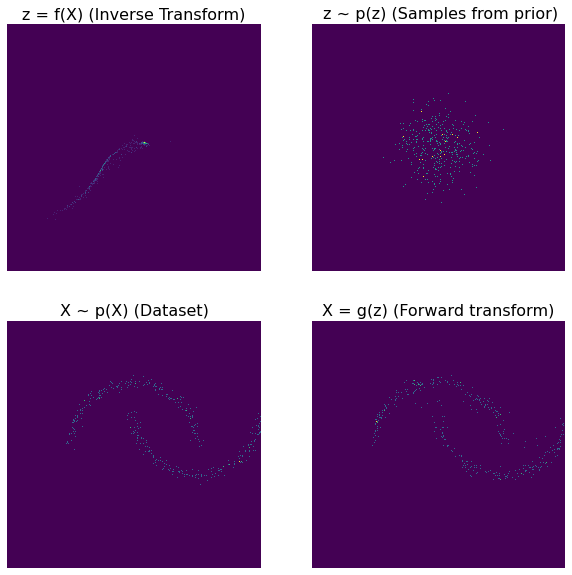

In [12]:
test =None
for i,data in enumerate(train_loader):
    if test is not None:
        test=torch.cat((test,data),dim=0)
    else:
        test=data.clone()


viz_samples = test.size()[0]
vis_samples = 1000

## samples from the flow
z_t0 = p_z0.sample([viz_samples]).to(device)

logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32).to(device)
viz_timesteps = 20

### forward
ts = torch.tensor(np.linspace(t0, t1, viz_timesteps)).to(device)
z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

z_t = z_t_samples[-1]
ts_inverse = torch.tensor(np.linspace(t1, t0, viz_timesteps)).type(torch.float32)# for training, we flow the samples backward (in time)

z_inverse, _ =  cnf(ts_inverse, z_t0, logp_diff_t0)

plot_samples(test, path_results, dataset_name, z_t0, z_t, z_inverse[-1])


In [17]:
dataset_name= "two_blobs"
train_loader, test_loader = data_load_split(dataset_name=dataset_name, path="./data/", batch_size=32, training_frac= 0.8)


In [18]:
# model and flow parameters
hidden_dim = 32
width= 64

# optimization parameters
lr= 3e-3

# model
cnf= CNF(in_out_dim=2, hidden_dim=hidden_dim, width=width)
print(cnf)

CNF(
  (f): HyperNetwork(
    (fc1): Linear(in_features=1, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc3): Linear(in_features=32, out_features=448, bias=True)
  )
)


In [19]:
print('Training...')
cnf = cnf.train()
a = 0
z0 = []
t0 = 0  # flow start time
t1 = 1  # flow end time
ts= torch.tensor([t1, t0]).type(torch.float32)# for training, we flow the samples backward (in time)
p_z0 = torch.distributions.MultivariateNormal(
    loc=torch.tensor([0.0, 0.0]),
    covariance_matrix=torch.tensor([[0.1, 0.0], [0.0, 0.1]])
)
#Training
optimizer = torch.optim.Adam(cnf.parameters(), lr=lr)

epochs = 100

start  = time.time()

for epoch in range(1, epochs):
    loss_sum = 0.0
    z_epoch= None
    for i, data in enumerate(train_loader):
        data = data.type(torch.FloatTensor)
        x1 = data
        optimizer.zero_grad()
        a += x1.size()[0]
        # initialize initial densities
        logp_diff_t1 = torch.zeros(x1.size()[0], 1).type(torch.float32)

        # compute the backward solutions
        z_t, logp_diff_t = cnf(ts, x1, logp_diff_t1)  # outputs time first
        ####################################################################
        ## z_t is z_dash because ts is t1 t0
        z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
        z0.append(z_t0.detach().cpu())
        if z_epoch is not None:
            z_epoch=torch.cat((z_epoch,z_t0),dim=0)
        else:
            z_epoch=z_t0.clone()
        # compute the density of each sample
        logp_x = p_z0.log_prob(z_t0) - logp_diff_t0  # .view(-1)
        loss = -logp_x.mean(0)
        loss.sum().backward()
        optimizer.step()
        loss_sum += loss.sum().detach().cpu().item()
    

    if epoch % 1 == 0:
        print('Epoch: {}/{}, Loss: {:.3f}'.format(epoch, epochs, loss_sum / len(train_loader)))


# make_gif("./gif-res", "./cnf-res")
if(os.path.exists(path_models)):
    torch.save(cnf, f"{path_models}/cnf-{dataset_name}.pt")
else:
    os.makedirs(path_models)
    torch.save(cnf, f"{path_models}/cnf-{dataset_name}.pt")
    
end = time.time()
print('Training finished in: ', (end - start) / 60, 'minutes')




Training...
Epoch: 1/100, Loss: 64.439
Epoch: 2/100, Loss: 26.810
Epoch: 3/100, Loss: 18.561
Epoch: 4/100, Loss: 14.350
Epoch: 5/100, Loss: 12.137
Epoch: 6/100, Loss: 10.420
Epoch: 7/100, Loss: 10.013
Epoch: 8/100, Loss: 10.477
Epoch: 9/100, Loss: 9.255
Epoch: 10/100, Loss: 8.905
Epoch: 11/100, Loss: 9.210
Epoch: 12/100, Loss: 8.572
Epoch: 13/100, Loss: 8.359
Epoch: 14/100, Loss: 8.211
Epoch: 15/100, Loss: 8.546
Epoch: 16/100, Loss: 8.358
Epoch: 17/100, Loss: 8.343
Epoch: 18/100, Loss: 8.713
Epoch: 19/100, Loss: 8.468
Epoch: 20/100, Loss: 8.058
Epoch: 21/100, Loss: 9.051
Epoch: 22/100, Loss: 8.646
Epoch: 23/100, Loss: 7.755
Epoch: 24/100, Loss: 7.627
Epoch: 25/100, Loss: 7.651
Epoch: 26/100, Loss: 7.427
Epoch: 27/100, Loss: 7.605
Epoch: 28/100, Loss: 7.667
Epoch: 29/100, Loss: 8.141
Epoch: 30/100, Loss: 7.956
Epoch: 31/100, Loss: 7.470
Epoch: 32/100, Loss: 7.984
Epoch: 33/100, Loss: 7.824
Epoch: 34/100, Loss: 8.282
Epoch: 35/100, Loss: 7.389
Epoch: 36/100, Loss: 8.125
Epoch: 37/100, Lo

In [20]:

cnf = torch.load(f"{path_models}/cnf-{dataset_name}.pt")
cnf = cnf.eval()

In [21]:

d=None
for idx, data in enumerate(test_loader):
    if d is not None:
        d=torch.cat((d,data),dim=0)
    else:
        d=data.clone()
    
# !pip install ipython
from IPython import display
# samples
viz_samples   = d.shape[0]
viz_timesteps = 41

t0 = 0  # flow start time
t1 = 1  # flow end time

# simulate the flow
with torch.no_grad():
    # Generate evolution of samples
    z_t0 = p_z0.sample([viz_samples])
    logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32)

    ts = torch.tensor(np.linspace(t0, t1, viz_timesteps))
    z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

    # Generate evolution of density
    x = np.linspace(-2, 2.5, 100)
    y = np.linspace(-2, 2.5, 100)
    points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T
    
    z_t1 = torch.tensor(points).type(torch.float32)
    logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32)
    ts = torch.tensor(np.linspace(t1, t0, viz_timesteps))
    z_t_density, logp_diff_t = cnf(ts, z_t1, logp_diff_t1)
anim = plot_cnf_animation(d, t0, t1, viz_timesteps, p_z0, z_t1, z_t_samples, z_t_density, logp_diff_t,gif_path)
display.HTML(anim.to_jshtml())

In [22]:
 make_gif(gif_path, f"{path_results}/cnf_{dataset_name}")

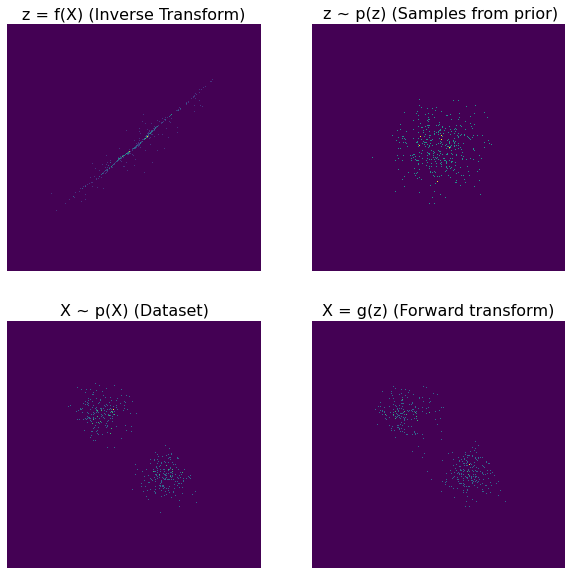

In [23]:
test =None
for i,data in enumerate(train_loader):
    if test is not None:
        test=torch.cat((test,data),dim=0)
    else:
        test=data.clone()


viz_samples = test.size()[0]
vis_samples = 1000

## samples from the flow
z_t0 = p_z0.sample([viz_samples]).to(device)

logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32).to(device)
viz_timesteps = 20

### forward
ts = torch.tensor(np.linspace(t0, t1, viz_timesteps)).to(device)
z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

z_t = z_t_samples[-1]
ts_inverse = torch.tensor(np.linspace(t1, t0, viz_timesteps)).type(torch.float32)# for training, we flow the samples backward (in time)

z_inverse, _ =  cnf(ts_inverse, z_t0, logp_diff_t0)

plot_samples(test, path_results, dataset_name, z_t0, z_t, z_inverse[-1])


In [26]:
dataset_name= "boomerang"
train_loader, test_loader = data_load_split(dataset_name=dataset_name, path="./data/", batch_size=32, training_frac= 0.8)


In [27]:
# model and flow parameters
hidden_dim = 32
width= 64

# optimization parameters
lr= 3e-3

# model
cnf= CNF(in_out_dim=2, hidden_dim=hidden_dim, width=width)
print(cnf)

CNF(
  (f): HyperNetwork(
    (fc1): Linear(in_features=1, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc3): Linear(in_features=32, out_features=448, bias=True)
  )
)


In [28]:
print('Training...')
cnf = cnf.train()
a = 0
z0 = []
t0 = 0  # flow start time
t1 = 1  # flow end time
ts= torch.tensor([t1, t0]).type(torch.float32)# for training, we flow the samples backward (in time)
p_z0 = torch.distributions.MultivariateNormal(
    loc=torch.tensor([0.0, 0.0]),
    covariance_matrix=torch.tensor([[0.1, 0.0], [0.0, 0.1]])
)
#Training
optimizer = torch.optim.Adam(cnf.parameters(), lr=lr)

epochs = 100

start  = time.time()

for epoch in range(1, epochs):
    loss_sum = 0.0
    z_epoch= None
    for i, data in enumerate(train_loader):
        data = data.type(torch.FloatTensor)
        x1 = data
        optimizer.zero_grad()
        a += x1.size()[0]
        # initialize initial densities
        logp_diff_t1 = torch.zeros(x1.size()[0], 1).type(torch.float32)

        # compute the backward solutions
        z_t, logp_diff_t = cnf(ts, x1, logp_diff_t1)  # outputs time first
        ####################################################################
        ## z_t is z_dash because ts is t1 t0
        z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
        z0.append(z_t0.detach().cpu())
        if z_epoch is not None:
            z_epoch=torch.cat((z_epoch,z_t0),dim=0)
        else:
            z_epoch=z_t0.clone()
        # compute the density of each sample
        logp_x = p_z0.log_prob(z_t0) - logp_diff_t0  # .view(-1)
        loss = -logp_x.mean(0)
        loss.sum().backward()
        optimizer.step()
        loss_sum += loss.sum().detach().cpu().item()
    

    if epoch % 1 == 0:
        print('Epoch: {}/{}, Loss: {:.3f}'.format(epoch, epochs, loss_sum / len(train_loader)))

# make_gif("./gif-res", "./cnf-res")
if(os.path.exists(path_models)):
    torch.save(cnf, f"{path_models}/cnf-{dataset_name}.pt")
else:
    os.makedirs(path_models)
    torch.save(cnf, f"{path_models}/cnf-{dataset_name}.pt")
    
end = time.time()
print('Training finished in: ', (end - start) / 60, 'minutes')




Training...
Epoch: 1/100, Loss: 8273.751
Epoch: 2/100, Loss: 7214.965
Epoch: 3/100, Loss: 5776.484
Epoch: 4/100, Loss: 4761.839
Epoch: 5/100, Loss: 4035.260
Epoch: 6/100, Loss: 3530.203
Epoch: 7/100, Loss: 3140.926
Epoch: 8/100, Loss: 2837.468
Epoch: 9/100, Loss: 2588.504
Epoch: 10/100, Loss: 2385.749
Epoch: 11/100, Loss: 2207.862
Epoch: 12/100, Loss: 2058.391
Epoch: 13/100, Loss: 1925.057
Epoch: 14/100, Loss: 1808.259
Epoch: 15/100, Loss: 1701.755
Epoch: 16/100, Loss: 1610.490
Epoch: 17/100, Loss: 1524.045
Epoch: 18/100, Loss: 1455.130
Epoch: 19/100, Loss: 1371.911
Epoch: 20/100, Loss: 1316.177
Epoch: 21/100, Loss: 1250.312
Epoch: 22/100, Loss: 1203.392
Epoch: 23/100, Loss: 1151.611
Epoch: 24/100, Loss: 1095.399
Epoch: 25/100, Loss: 1056.045
Epoch: 26/100, Loss: 1011.351
Epoch: 27/100, Loss: 969.212
Epoch: 28/100, Loss: 939.315
Epoch: 29/100, Loss: 896.938
Epoch: 30/100, Loss: 864.602
Epoch: 31/100, Loss: 836.374
Epoch: 32/100, Loss: 804.503
Epoch: 33/100, Loss: 776.715
Epoch: 34/100,

In [29]:

cnf = torch.load(f"{path_models}/cnf-{dataset_name}.pt")
cnf = cnf.eval()

In [36]:

d=None
for idx, data in enumerate(test_loader):
    if d is not None:
        d=torch.cat((d,data),dim=0)
    else:
        d=data.clone()
    
# !pip install ipython
from IPython import display
# samples
viz_samples   = d.shape[0]
viz_timesteps = 41

t0 = 0  # flow start time
t1 = 1  # flow end time

# simulate the flow
with torch.no_grad():
    # Generate evolution of samples
    z_t0 = p_z0.sample([viz_samples])
    logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32)

    ts = torch.tensor(np.linspace(t0, t1, viz_timesteps))
    z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

    # Generate evolution of density
    x = np.linspace(-2, 2.5, 100)
    y = np.linspace(-2, 2.5, 100)
    points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T
    
    z_t1 = torch.tensor(points).type(torch.float32)
    logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32)
    ts = torch.tensor(np.linspace(t1, t0, viz_timesteps))
    z_t_density, logp_diff_t = cnf(ts, z_t1, logp_diff_t1)
anim = plot_cnf_animation(d, t0, t1, viz_timesteps, p_z0, z_t1, z_t_samples, z_t_density, logp_diff_t,gif_path)
display.HTML(anim.to_jshtml())

In [37]:
 make_gif(gif_path, f"{path_results}/cnf_{dataset_name}")

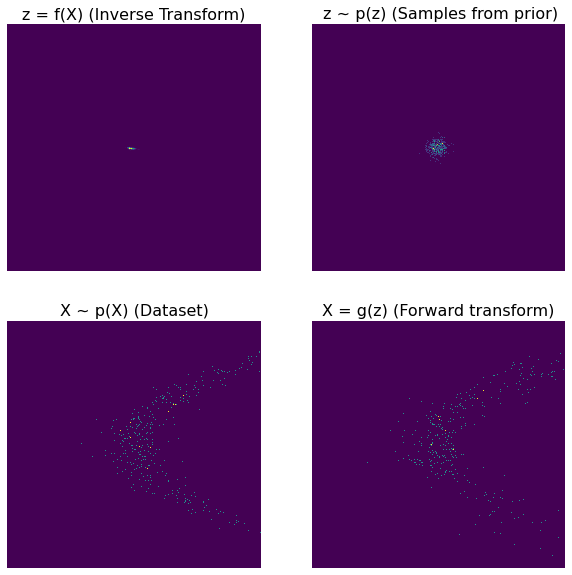

In [35]:
test =None
for i,data in enumerate(train_loader):
    if test is not None:
        test=torch.cat((test,data),dim=0)
    else:
        test=data.clone()


viz_samples = test.size()[0]
vis_samples = 1000

## samples from the flow
z_t0 = p_z0.sample([viz_samples]).to(device)

logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32).to(device)
viz_timesteps = 20

### forward
ts = torch.tensor(np.linspace(t0, t1, viz_timesteps)).to(device)
z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

z_t = z_t_samples[-1]
ts_inverse = torch.tensor(np.linspace(t1, t0, viz_timesteps)).type(torch.float32)# for training, we flow the samples backward (in time)

z_inverse, _ =  cnf(ts_inverse, z_t0, logp_diff_t0)

plot_samples(test, path_results, dataset_name, z_t0, z_t, z_inverse[-1], range_min=[-8,8], range_max=[-8,8])
